In [1]:
### PREREQUISITIES

### these are basic and should go easy
import sys
import pandas as pd
import numpy as np
import os
import string as str_p
import collections
import regex as re

### NLTK  - natural language processing 
###this requires installation
import nltk
from nltk.collocations import *

### Beautiful Soup and Urllib
### for scrapping of web data and parsing xml files
from urllib.request import urlopen
from bs4 import BeautifulSoup

### for network analysis
import networkx as nx

from sklearn.feature_extraction.text import CountVectorizer

### for plotting
import matplotlib.pyplot as plt



### for visualization
import plotly.plotly as py
import plotly.graph_objs as go
#from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.io as pio
init_notebook_mode(connected=True)

### to export data
import gspread
from gspread_dataframe import get_as_dataframe, set_with_dataframe

### set up the credentials
from oauth2client.service_account import ServiceAccountCredentials
scope = ['https://spreadsheets.google.com/feeds',
         'https://www.googleapis.com/auth/drive']
creds = ServiceAccountCredentials.from_json_keyfile_name('jupgsheets.json', scope)
gc = gspread.authorize(creds)

In [14]:
def replacer_place(string):
    return re.split(r'\.html', re.split(r'\.org\/', string)[1])[0].replace("/", "_")

def ehri_url_title_returner(url):
    ref = url
    page = urlopen(ref)
    soup_simple = BeautifulSoup(page, "html.parser")
    return soup_simple.find("title").get_text().partition("EHRI - ")[2].replace(" ", "_")


def replacer_pers(url):
    return url.partition("ehri_pers-")[2]

def CapCol(word):
    name_parts = word.replace("-","_").split("_")
    name_parts_new = []
    for part in name_parts:
        if part in ["of"]: ### other words can be added in the future
            name_parts_new.append(part)
        else:
            if (len(part) > 1) and (part[1].islower() is False):
                name_parts_new.append(part)
            else:
                name_parts_new.append(part.capitalize())
    return "_".join(name_parts_new)

from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()
def lem(word):
    wordnet_lemmatizer.lemmatize(word.lower())

    
### THE MAIN TEXT PARSING, CLEANING AND PREPROCESSING FUNCTION
def cleaned_list_of_words_builder(xml_file_name):
    with open(xml_file_name) as file:
        soup = BeautifulSoup(file, "html.parser")
    list_of_camps = []
    for link in soup.find_all("placename", type="camp"):
        camp = [link.get_text(), link.get("ref")]
        if camp[1] not in [element[1] for element in list_of_camps]:
            list_of_camps.append(camp) 
    place_names = []
    for place in soup.find_all("placename"):
        if "geonames" in str(place.get):
            place_name_modified = replacer_place(place.get("ref")).partition("_")[2]
            place_name_modified = place_name_modified.replace("-", "_")
            place_names.append([place.get_text(), place.get("ref"), place_name_modified])
        if "portal.ehri" in str(place.get):
            try:
                place_names.append([place.get_text(), place.get("ref"), ehri_url_title_returner(place.get("ref")).partition("_conc")[0]])
            except:
                place_names.append([place.get_text(), place.get("ref"), place.get_text().replace(" ", "_")])
        if "ehri_et_" in str(place.get):   
            place_names.append([place.get_text(), "ehri_et", place.get("ref").partition("ehri_et_")[2].capitalize()])
    place_names_modified = list(set([CapCol(element[2]) for element in place_names])) 
    camp_names = list(set([CapCol(element[2]) for element in place_names if "camp" in element[1]]))
    ghetto_names = list(set([CapCol(element[2]) for element in place_names if "ghetto" in element[1]]))
    persnames = []
    for persname in soup.find_all("persname"):
        persname_ref = persname.get("ref")
        if persname_ref != None:
            if "ehri_et" in persname_ref: 
                persnames.append([persname.get_text(), "ehri_name", persname_ref.partition("ehri_et_")[2]])
            if "portal.ehri" in persname_ref:
                try:
                    persnames.append([persname.get_text(), persname_ref, ehri_url_title_returner(persname_ref)])
                except: 
                    persnames.append([persname.get_text(), persname_ref, persname.get_text()])
        else:
            persname_changed =  persname.get_text().replace(" ", "_")
            if "__" in persname_changed:
                persname_changed.replace('__+', '_')
            persnames.append([persname.get_text(), "name", persname_changed.replace("\n", "")])
    persnames_modified = list(set([CapCol(element[2]) for element in persnames]))
    terms_number = len(soup.find_all("term"))
    terms_tags = []
    for term in soup.find_all("term"):
        term_ref = term.get("ref")
        if term_ref != None:
            try:
                terms_tags.append([term.get_text(), term_ref, ehri_url_title_returner(term_ref)])
            except: 
                pass
    terms_modified = list(set([CapCol(element[2]) for element in terms_tags]))
    ### extract raw text from the "soup" as a list of paragraphs
    raw_text = []
    all_p = soup.body.find_all("p")
    for p in all_p:
        raw_text.append(p.get_text())
    raw_text_str = " ".join(raw_text)
    ### replace the raw text versions of place names and personal names by the preprocessed versions
    for place in place_names:
        raw_text_str = raw_text_str.replace(" " + place[0], " " + place[2], 1)
    for person in persnames:
        raw_text_str = raw_text_str.replace(" " + person[0], " " + person[2], 1)
    for term in terms_tags:
        raw_text_str = raw_text_str.replace(" " + term[0], " " + term[2], 1)
    ### remove newlines characters
    cleaned_text_1  = " ".join(raw_text_str.splitlines())
    cleaned_text_2 = cleaned_text_1.replace("\xa0", " ")
    if "  " in cleaned_text_2:
        cleaned_text_3 = re.sub(r'\s\s+', ' ', cleaned_text_2)
    else:
        cleaned_text_3 = cleaned_text_2
    ### remove punctuation
    for character in str_p.punctuation:
        if character != "_":
            cleaned_text_3 = cleaned_text_3.replace(character, "")
    cleaned_text_list = [word for word in cleaned_text_3.split()]
    ### lemmatize as verbs
    lemmatized_document = [wordnet_lemmatizer.lemmatize(word.lower(), pos="v") for word in cleaned_text_list]
    ### lemmatize as nouns
    lemmatized_document = [wordnet_lemmatizer.lemmatize(word, pos="n") for word in lemmatized_document]
    ### generate POS-tags
    postagged_document = nltk.pos_tag(lemmatized_document)
    exceptions = []
    for element in (set(lemmatized_document)):
        if element == "ss":
            exceptions.append(element.upper())
    ### to subselect only nouns, verbs and adjectives
    special_words = persnames_modified + place_names_modified + terms_modified
    document_filtered = []
    for pos_tuple in postagged_document:
        if CapCol(pos_tuple[0]) in special_words:
            document_filtered.append(CapCol(pos_tuple[0]))
        else:
            if pos_tuple[0] not in ['–', "ie", "i", "be"]:
                ### minimalistic dataset:
                if (pos_tuple[1] in ["NN", "NNP", "NNS"]) or (pos_tuple[0] in exceptions):
                ### extensive: if (pos_tuple[1] in ["CD", "NN", "NNP", "NNS", "JJ", "JJR", "JJS", 'VB', 'VBD', 'VBG','VBN', 'VBP','VBZ']) or (pos_tuple[0] in exceptions):
                    document_filtered.append(pos_tuple[0])
    return document_filtered, place_names_modified, camp_names, ghetto_names, persnames_modified, terms_modified #, terms_modified

In [15]:
JMP010 = cleaned_list_of_words_builder("data/data_EN/JMP_TEI_preklady_EN/EHRI-ET-JMP010_EN.xml")

In [11]:
cleaned_texts_list = []
file_names = []
for dirpath, dirs, files in os.walk("data/data_EN/JMP_TEI_preklady_EN"):
    for file_name in files:
        file_with_dirpath = dirpath + "/" + file_name
        cleaned_texts_list.append(cleaned_list_of_words_builder(file_with_dirpath))
        file_names.append(file_name)

In [12]:
cleaned_texts_df = pd.DataFrame(cleaned_texts_list)
cleaned_texts_df["file_names"] = file_names()
cleaned_texts_df

,0,1,2,3,4,5,file_names
0,"[documentation, terezin_ghettoaign, illusion, ...","[Czechia, Bohusovice_Nad_Ohri, Berlin, Prague,...",[Auschwitz],[Terezin_Ghetto],"[Wolfgang_Schellenbacher, Zucker,_Ota_(*_3.10....",135,EHRI-ET-JMP011_EN.xml
1,"[dear, touch, mother, tongue, paper, world, ne...","[Prague, Small_Fortress, Czechoslovakia, Terez...",[Auschwitz_II_Birkenau],[Terezin_Ghetto],"[Wolfgang_Schellenbacher, Magdalena_Sedlická, ...",17,EHRI-ET-JMP003_EN.xml
2,"[Prague, viii, statement, Schmiedt_Alexander, ...","[Vienna, United_States, Kaufering_VI, Prague, ...","[Kaufering_VI, Kaufering_I, Kaufering_III, Kau...",[Terezin_Ghetto],"[Wolfgang_Schellenbacher, Shek_Zeev, Lindenbau...",126,EHRI-ET-JMP001_EN.xml
3,"[statement, copy, statement, sign, mr, Morgens...","[Narva, Raasiku, Republic_of_Estonia, Frankfur...","[Bergen_Belsen, Stutthof, Auschwitz]",[Riga_Ghetto],"[Wolfgang_Schellenbacher, Shek_Zeev, Magdalena...",87,EHRI-ET-JMP013_EN.xml
4,"[extract, statement, Lobner_Walter, ellrichjul...","[Czechia, Harmense, Prague, Hermanova_Hut, Sac...","[Harmense, Budy, Ellrich_Juliushütte, Auschwit...",[],"[Wigger_Hubert, Bohlke_Max, Wirths_Eduard, Van...",148,EHRI-ET-JMP017_EN.xml
5,"[it’s, freeze, hay, railway, car, matter, thin...","[Bergen_Belsen, Prague, Auschwitz_II_Birkenau,...","[Bergen_Belsen, Auschwitz_II_Birkenau]",[],"[Wolfgang_Schellenbacher, Bondyova_Herta, Magd...",35,EHRI-ET-JMP009_EN.xml
6,"[statement, write, mr, Kulka_Erich, reside, Vs...","[Neuengamme, Prague, Auschwitz, Sereg, Zilina,...","[Neuengamme, Auschwitz, Auschwitz_II_Birkenau,...",[Terezin_Ghetto],"[Edelstein,_Arje_(*_15.5.1931), Wolfgang_Schel...",59,EHRI-ET-JMP005_EN.xml
7,"[statement, Lebensfeldova_Hofstadterova_Regine...","[Czechia, Russian_Federation, Strzelce_Dolne, ...","[Malchow, Auschwitz, Ravensbrück, Königshütte_...",[],"[Weniger_Gertrud, Kramer_Josef, Jarosewitsch, ...",430,EHRI-ET-JMP019_EN.xml
8,"[child, child, Terezin_Ghetto, right, transpor...","[Terezin_Ghetto, Prague, Brno]",[],[Terezin_Ghetto],"[Redlich,_Egon_(*_13.10.1916), Wolfgang_Schell...",86,EHRI-ET-JMP007_EN.xml
9,"[statement, write, bear, Prague, Nováky, labor...","[Prague, Nizke_Tatry, Banska_Bystrica, Okres_P...",[Nováky],[],"[Wolfgang_Schellenbacher, Shek_Zeev, Magdalena...",37,EHRI-ET-JMP015_EN.xml


In [113]:
def most_common_string_number(text, number):
    data = nltk.FreqDist(text).most_common(number)
    data_modified = ", ".join([str(element[0]) + ": " + str(element[1]) for element in data])
    return data_modified
    
texts_basics_overview = []
for name, text in zip(file_names,cleaned_texts_list):
    #name = name.partition("_EN/")[2]
    texts_basics_overview.append([name,len(text[0]), most_common_string_number(text[0], 10)])
texts_basics_overview_df = pd.DataFrame(texts_basics_overview, columns=["name", "length", "most_frequent"])
texts_basics_overview_df.sort_values("length", ascending=False).head(5)

,name,length,most_frequent
45,EHRI-ET-JMP010_EN.xml,1296,"gas: 54, transport: 50, woman: 44, camp: 34, p..."
42,EHRI-ET-JMP019_EN.xml,1127,"camp: 73, prisoner: 73, crematorium: 19, offic..."
11,EHRI-ET-ZIH3010014_EN.xml,591,"camp: 31, people: 28, worker: 18, jew: 14, tra..."
35,EHRI-ET-JMP011_EN.xml,572,"Terezin_Ghetto: 20, jew: 13, transport: 12, il..."
48,EHRI-ET-JMP008_EN.xml,542,"Terezin_Ghetto: 16, opera: 11, play: 8, singer..."


In [ ]:
### to connect with a google spread sheet file
sh = gc.open_by_url("https://docs.google.com/spreadsheets/d/1W9TnF_x1v2i8DHgl3L6-A6KmtwGyOHC3CfsiVZtMJtg/edit?usp=sharing")

In [ ]:
set_with_dataframe(sh.add_worksheet(title="documents_basic_overview", rows=1, cols=1), texts_basics_overview_df)

In [98]:
cleaned_texts_joined_list = [" ".join(element[0]) for element in cleaned_texts_list]

In [99]:
### merge places and persons together to check the most frequent ones
all_places = []
all_camps = []
all_persons = [] 
for element in cleaned_texts_list:
    all_places.extend(element[1])
    all_camps.extend(element[2])
    all_persons.extend(element[3])
places_most100 = nltk.FreqDist(all_places).most_common(100)
camps_most100 = nltk.FreqDist(all_camps).most_common(100)
persons_most100 = nltk.FreqDist(all_persons).most_common(100)

In [100]:
places_most100[:10]

[('Auschwitz_II_Birkenau', 28),
 ('Prague', 20),
 ('Auschwitz', 15),
 ('Warsaw', 12),
 ('Republic_of_Poland', 11),
 ('Hungary', 11),
 ('Terezin_Ghetto', 11),
 ('Bergen_Belsen', 9),
 ('Budapest', 9),
 ('Kosice', 9)]

In [110]:
camps_most100[:10]

[('Auschwitz_II_Birkenau', 28),
 ('Auschwitz', 15),
 ('Bergen_Belsen', 9),
 ('Dachau', 5),
 ('Treblinka_Extermination_Camp', 5),
 ('Theresienstadt', 5),
 ('Auschwitz_III_Monowitz', 4),
 ('Buchenwald', 4),
 ('Gross_Rosen', 4),
 ('Sachsenhausen', 4)]

# Wordcloud

In [15]:
### based on https://www.datacamp.com/community/tutorials/wordcloud-python

from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator, get_single_color_func
import matplotlib.pyplot as plt

In [ ]:
### how the data look like:
###document_filtered, place_names_modified, camp_names, persnames_modified

In [117]:
class SimpleGroupedColorFunc(object):
    def __init__(self, color_to_words, default_color):
        self.word_to_color = {word: color
                              for (color, words) in color_to_words.items()
                              for word in words}
        self.default_color = default_color
    def __call__(self, word, **kwargs):
        return self.word_to_color.get(word, self.default_color)
grouped_color_func = SimpleGroupedColorFunc(color_to_words, default_color)

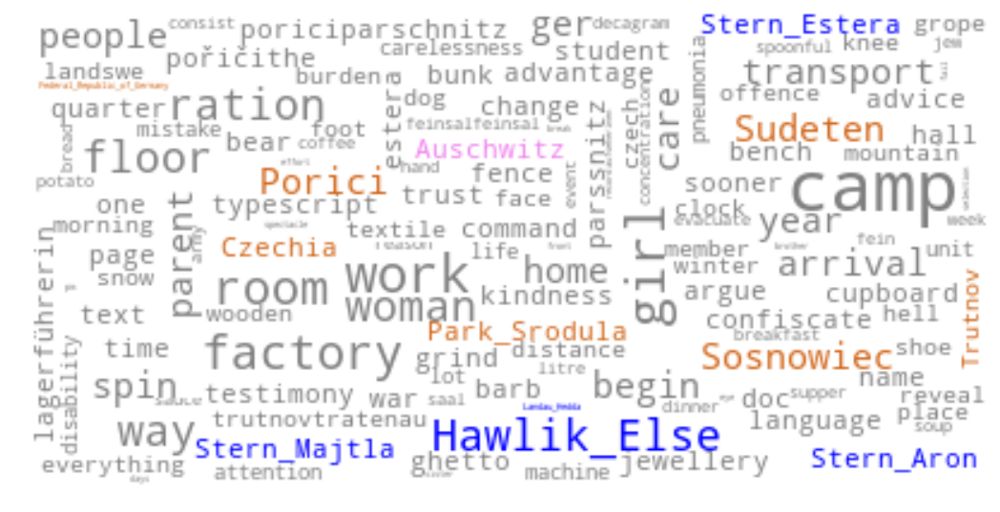

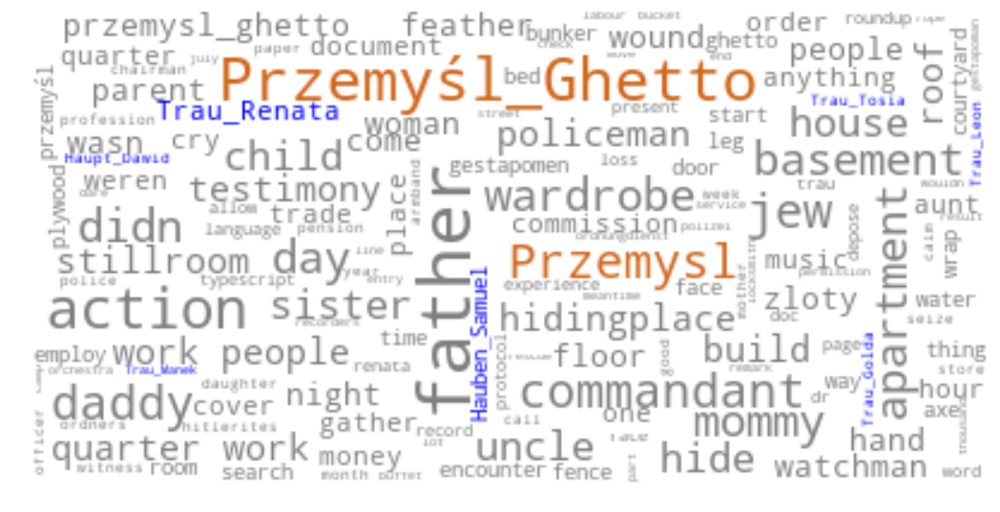

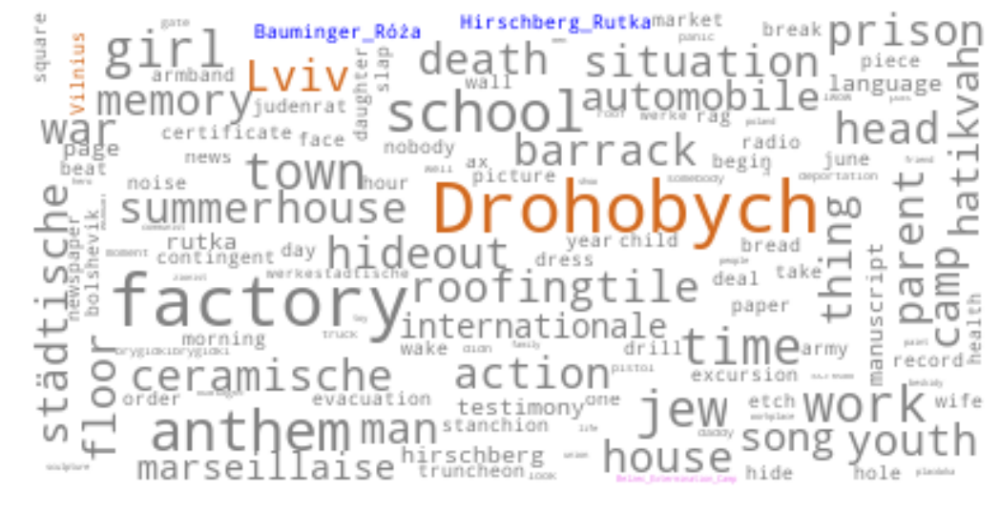

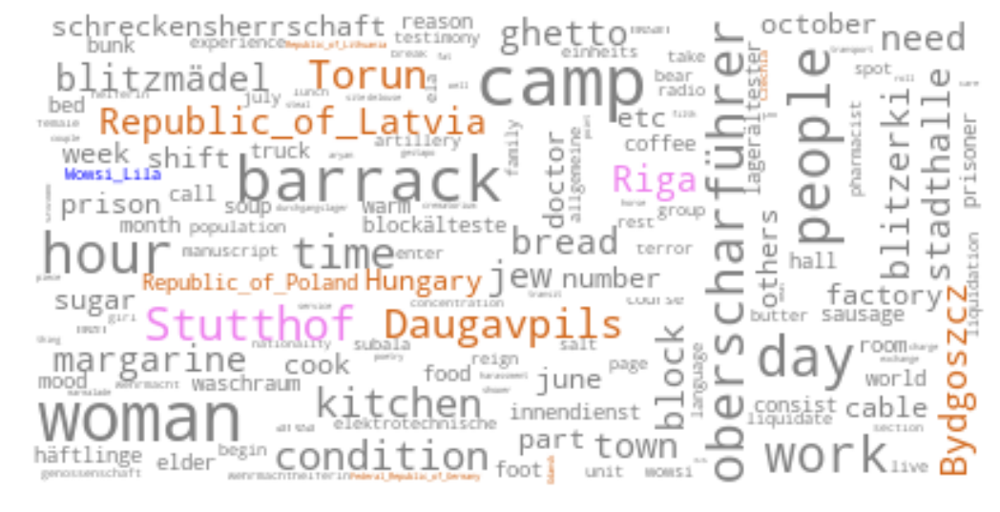

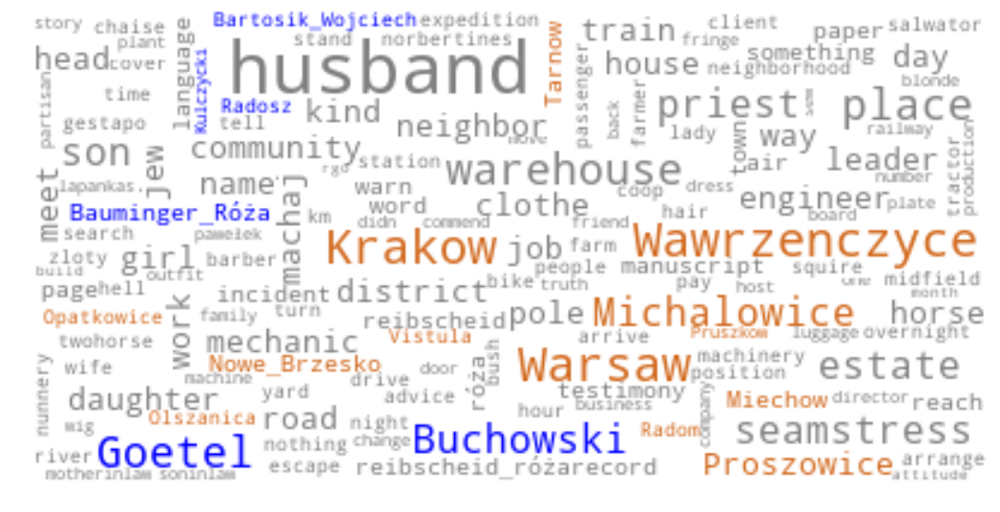

...

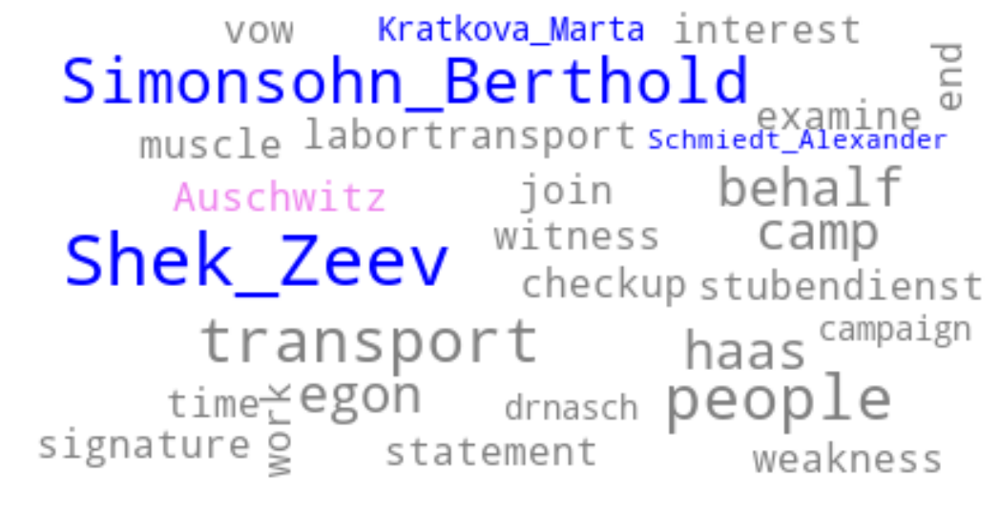

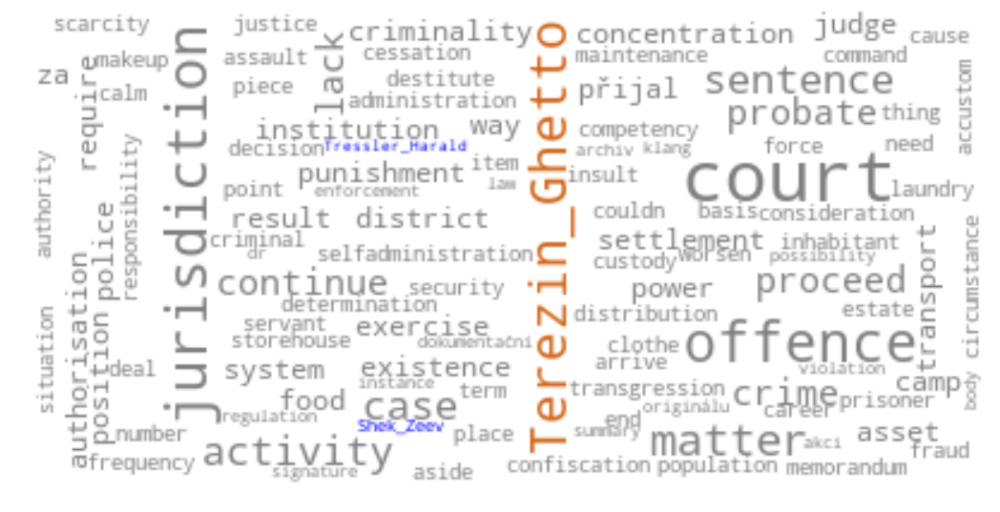

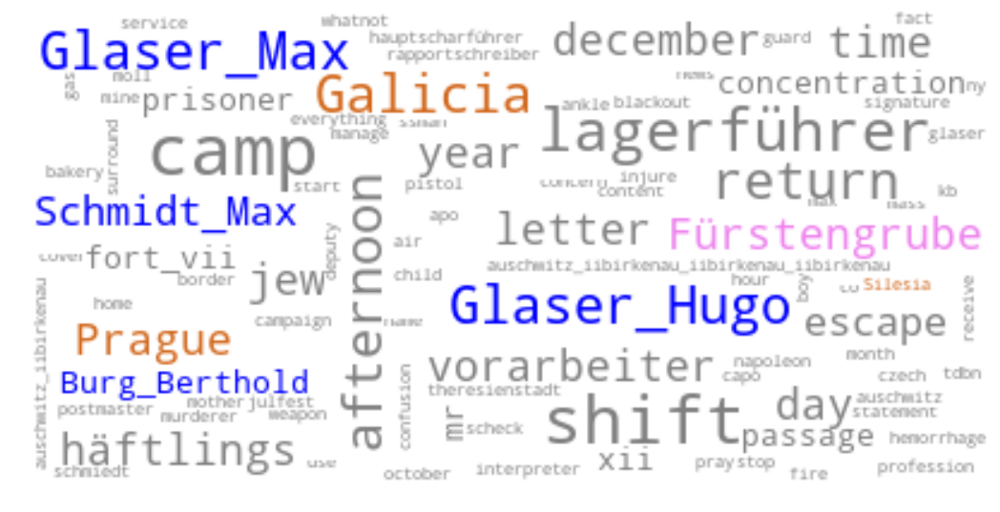

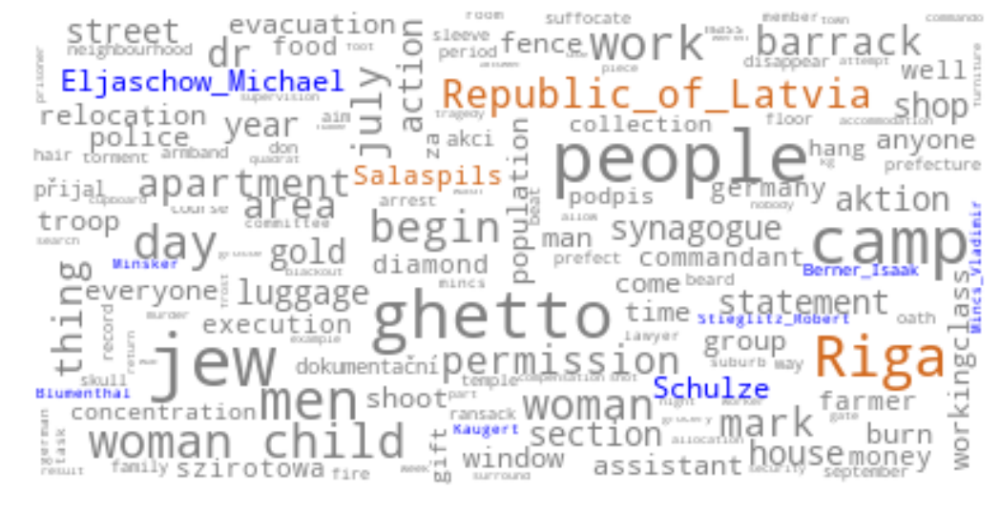

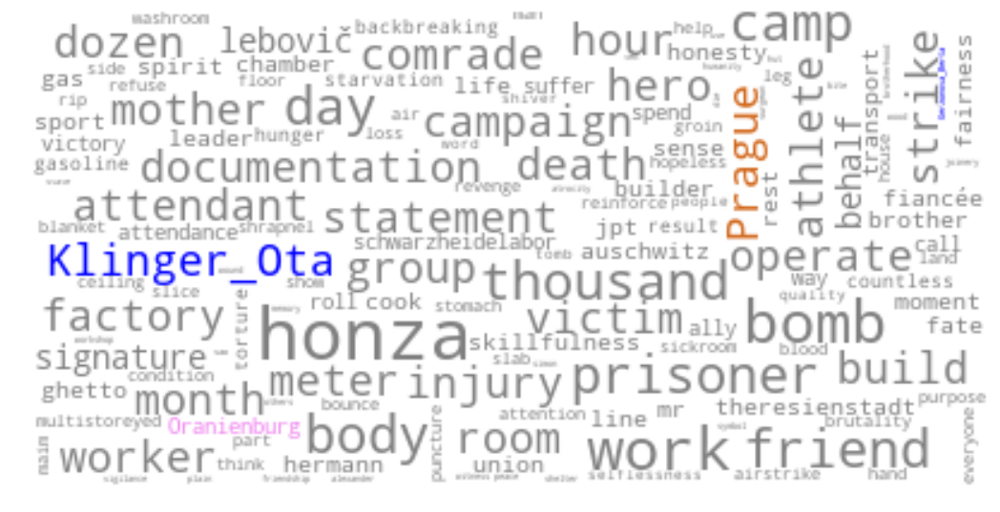

In [124]:
for document, file_name in zip(cleaned_texts_list, file_names):
    wordcloud = WordCloud(max_font_size=30, max_words=150, background_color="white").generate(" ".join(document[0]))
    color_to_words = {
        ###"green" : nouns,
        "violet" : document[2],
        "chocolate" : [word for word in document[1] if word not in document[2]],
        "blue" : document[3]}
    default_color = "gray"
    grouped_color_func = SimpleGroupedColorFunc(color_to_words, default_color)
    wordcloud.recolor(color_func=grouped_color_func)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.savefig("images/wordclouds/" + file_name + ".png")
    plt.show()

# Vectorization and Distance

In [36]:
vec = CountVectorizer(min_df = 3)
X = vec.fit_transform(cleaned_texts_joined_list)

vectorization_df = pd.DataFrame(X.toarray(), columns=vec.get_feature_names())
### to add there the names of authors
CSEL_PL_vectorization_df = pd.concat([pd.Series(files), vectorization_df], axis=1)
# to save the vectorization data into a csv
CSEL_PL_vectorization_df.to_csv("data/vectorization.csv")
CSEL_PL_vectorization_df.head(5)

,0,10,100,1000,10000,1012,10th,11,1100,12,...,yard,year,yellow,yiddish,young,younger,youth,za,zloty,łódź_ghetto
0,EHRI-ET-JMP011_EN.xml,0,0,0,0,0,0,0,0,1,...,0,2,0,0,0,0,0,0,0,0
1,EHRI-ET-JMP003_EN.xml,2,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,3,0
2,EHRI-ET-JMP001_EN.xml,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,2,0,0,0
3,EHRI-ET-JMP013_EN.xml,0,2,1,0,0,0,1,0,2,...,0,0,0,1,0,0,0,0,0,0
4,EHRI-ET-JMP017_EN.xml,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0


In [8]:
### COSINE SIMILARITY
# https://en.wikipedia.org/wiki/Cosine_similarity
# as used here: https://de.dariah.eu/tatom/working_with_text.html#comparing-texts

from sklearn.metrics.pairwise import cosine_similarity
cosine_sim_matrix = cosine_similarity(X.toarray())
dist_cosine = 1 - cosine_similarity(X.toarray())

### MATRIX WITHOUT ROW AND COLUMN NAMES
cosine_sim_df = pd.DataFrame(np.round(cosine_sim_matrix, 5))
cosine_sim_df.to_csv("data/cosine_sim.csv")
cosine_sim_df.to_pickle("data/cosine_sim.pkl")

In [9]:
### MATRIX WITH ROW AND COLUMN NAMES
cosine_sim_df_with_names = pd.concat([pd.Series(files), cosine_sim_df], axis=1)
files_prolonged = file_names
files_prolonged.insert(0, "document")
cosine_sim_df_with_names.columns = files_prolonged
cosine_sim_df_with_names.to_csv("data/cosine_sim_with_names.csv")
cosine_sim_df_with_names.set_index("document", inplace=True)
cosine_sim_df_with_names.head(5)

,EHRI-ET-ZIH3010965_EN.xml,EHRI-ET-ZIH3010884_EN.xml,EHRI-ET-ZIH3011129_EN.xml,EHRI-ET-ZIH3010081_EN.xml,EHRI-ET-ZIH3011713_EN.xml,EHRI-ET-ZIH3011538_EN.xml,EHRI-ET-ZIH3010945_EN.xml,EHRI-ET-ZIH3010191_EN.xml,EHRI-ET-ZIH3010481_EN.xml,EHRI-ET-ZIH3010805_EN.xml,...,EHRI-ET-JMP010_EN.xml,EHRI-ET-JMP002_EN.xml,EHRI-ET-JMP012_EN.xml,EHRI-ET-JMP008_EN.xml,EHRI-ET-JMP016_EN.xml,EHRI-ET-JMP004_EN.xml,EHRI-ET-JMP020_EN.xml,EHRI-ET-JMP006_EN.xml,EHRI-ET-JMP018_EN.xml,EHRI-ET-JMP014_EN.xml
document,,,,,,,,,,,,,,,,,,,,,
EHRI-ET-JMP011_EN.xml,1.00000,0.28741,0.42929,0.56263,0.28527,0.44256,0.41917,0.35429,0.30904,0.33039,...,0.39226,0.47302,0.41346,0.34363,0.51879,0.26915,0.19951,0.34531,0.50057,0.32902
EHRI-ET-JMP003_EN.xml,0.28741,1.00000,0.48895,0.35474,0.36901,0.29359,0.41677,0.46408,0.34635,0.44852,...,0.26128,0.40673,0.41849,0.35678,0.42821,0.10064,0.15554,0.24928,0.45999,0.23549
EHRI-ET-JMP001_EN.xml,0.42929,0.48895,1.00000,0.43250,0.37044,0.31736,0.40321,0.45592,0.35032,0.43992,...,0.27813,0.41839,0.39684,0.38867,0.47610,0.13925,0.15028,0.29063,0.43620,0.34089
EHRI-ET-JMP013_EN.xml,0.56263,0.35474,0.43250,1.00000,0.25700,0.49072,0.44236,0.43760,0.37907,0.36003,...,0.43395,0.43600,0.45019,0.35808,0.55236,0.23576,0.15782,0.33288,0.59991,0.34939
EHRI-ET-JMP017_EN.xml,0.28527,0.36901,0.37044,0.25700,1.00000,0.27685,0.30105,0.40473,0.29630,0.37968,...,0.23301,0.36306,0.33556,0.33867,0.36039,0.11276,0.16978,0.23575,0.33481,0.22436


In [10]:
### to transform the distances into a n-dimensional space 
import matplotlib.pyplot as plt
from sklearn.manifold import MDS

In [11]:
# to have the plot big enough, we will modify default size of all generated plots
# (original is 6 to 4 inches)
plt.rcParams['figure.figsize'] = (18.0, 12.0)

In [12]:
# we need to transform the indovidual distances into a 2-dimensional space
mds = MDS(n_components=2, dissimilarity="precomputed", random_state=1)
pos = mds.fit_transform(dist_cosine)
xs, ys = pos[:, 0], pos[:, 1]

In [13]:
names = file_names

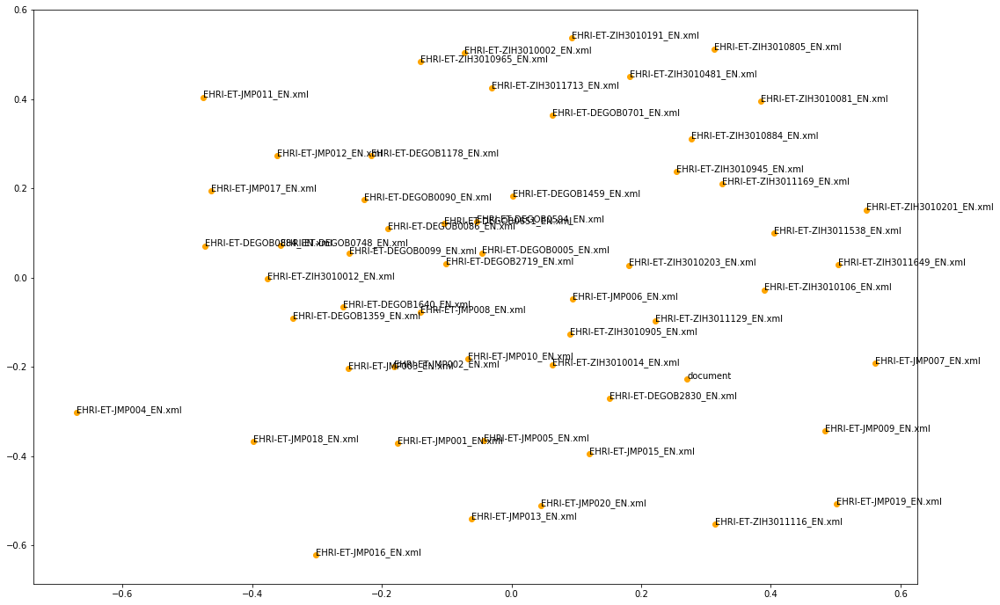

In [14]:
# now we can plot the distances transformed via the mds function as a scatter plot
for x, y, name in zip(xs, ys, names):
    color = "orange"
    plt.scatter(x, y, c=color)
    plt.text(x, y, name)
plt.savefig("images/distances_2d.png")
plt.show()